In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from easydict import EasyDict as edict
import drms
from sunpy.instr.goes import flareclass_to_flux, flux_to_flareclass
#flareclass_to_flux_extended = lambda s: -9 * u('W/m^2') if s == '' else flareclass_to_flux(s)
#flux_to_flareclass_extended = lambda q: '-9' if s == '' else flareclass_to_flux(s)

from utils import get_log_intensity

%load_ext autoreload
%autoreload 2

FEATURES = ['AREA', 'USFLUX', 'MEANGBZ', 'R_VALUE', 'FLARE_INDEX']

## GOES flare events

In [2]:
goes = pd.read_csv('/data2/GOES/goes.csv')
goes[goes['goes_class'].isna()]

,event_date,start_time,peak_time,end_time,goes_class,goes_location,noaa_active_region
0,1996-01-03,1996-01-03T13:08:00.000,1996-01-03T13:35:00.000,1996-01-03T14:04:00.000,NaN,"(8, 11)",7938
1,1996-01-03,1996-01-03T13:08:00.000,1996-01-03T13:35:00.000,1996-01-03T14:04:00.000,NaN,"(8, 11)",7938
8,1996-01-05,1996-01-05T14:46:00.000,1996-01-05T14:46:00.000,1996-01-05T14:50:00.000,NaN,"(36, 10)",7938
9,1996-01-05,1996-01-05T14:46:00.000,1996-01-05T14:46:00.000,1996-01-05T14:50:00.000,NaN,"(36, 10)",7938
14,1996-01-05,1996-01-05T20:17:00.000,1996-01-05T20:25:00.000,1996-01-05T20:45:00.000,NaN,"(40, 12)",7938
...,...,...,...,...,...,...,...
196,1996-07-12,1996-07-12T06:57:00.000,1996-07-12T07:02:00.000,1996-07-12T07:16:00.000,NaN,"(60, -10)",7978
201,1996-07-30,1996-07-30T16:03:00.000,1996-07-30T16:03:00.000,1996-07-30T16:08:00.000,NaN,"(-37, -10)",7981
202,1996-07-30,1996-07-30T16:03:00.000,1996-07-30T16:03:00.000,1996-07-30T16:08:00.000,NaN,"(-37, -10)",7981
228,1996-08-09,1996-08-09T14:43:00.000,1996-08-09T14:43:00.000,1996-08-09T15:00:00.000,NaN,"(1, 8)",7982


In [3]:
goes['goes_class'] = goes['goes_class'].fillna('')

In [4]:
goes[goes['goes_class'].str.match('X\d\d')] # X10.0+ flares

,event_date,start_time,peak_time,end_time,goes_class,goes_location,noaa_active_region
2016,2001-04-02,2001-04-02T21:32:00.000,2001-04-02T21:51:00.000,2001-04-02T22:03:00.000,X20.,"(0, 0)",9393
2041,2001-04-15,2001-04-15T13:19:00.000,2001-04-15T13:50:00.000,2001-04-15T13:55:00.000,X14.,"(85, -20)",9415
4879,2003-10-28,2003-10-28T09:51:00.000,2003-10-28T11:10:00.000,2003-10-28T11:24:00.000,X17.,"(0, 0)",10486
4885,2003-10-29,2003-10-29T20:37:00.000,2003-10-29T20:49:00.000,2003-10-29T21:01:00.000,X10.,"(2, -15)",10486
4920,2003-11-04,2003-11-04T19:29:00.000,2003-11-04T19:50:00.000,2003-11-04T20:06:00.000,X28.,"(83, -19)",10486
8122,2005-09-07,2005-09-07T17:17:00.000,2005-09-07T17:40:00.000,2005-09-07T18:03:00.000,X17.,"(-77, -11)",10808


Matched patterns of `goes['goes_class']`:
* Empty string converted from nan: `''`
* Normal sized flares: `'[A|B|C|M|X][1-9][.][0-9]'` or `[A|B|C|M|X][1-9]`
* Super X-class flares: `'X\d\d.'`

In [5]:
goes[~goes['goes_class'].str.fullmatch('(|[A|B|C|M|X][1-9]([.][0-9])?|X\d\d.)')]
# No record that doesn't match the above patterns

,event_date,start_time,peak_time,end_time,goes_class,goes_location,noaa_active_region


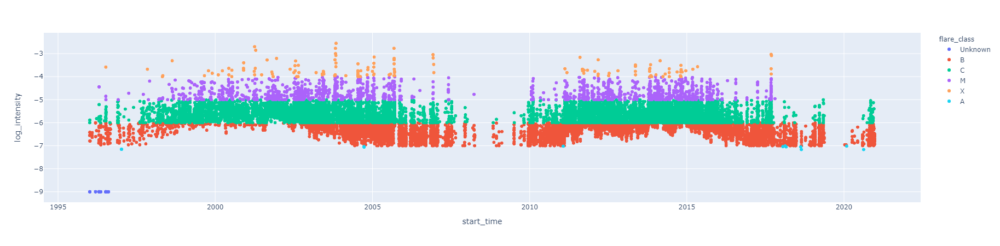

In [6]:
goes_vis = goes.copy()
goes_vis['log_intensity'] = goes_vis['goes_class'].apply(get_log_intensity)
goes_vis['flare_class'] = goes_vis['goes_class'].apply(lambda s: 'Unknown' if s == '' else s[0])
goes_vis['start_time'] = goes_vis['start_time'].apply(drms.to_datetime)
px.scatter(goes_vis, x='start_time', y='log_intensity', color='flare_class', hover_data=['noaa_active_region'])

In [7]:
smarp_start = drms.to_datetime('1996-06-27 06:24:00').strftime('%Y-%m-%dT%H:%M:%S:00.000') #2001-04-02T21:32:00.000
smarp_end = drms.to_datetime('2010-10-29 00:00:00').strftime('%Y-%m-%dT%H:%M:%S:00.000')
sharp_end = drms.to_datetime('2020-11-30 01:36:00').strftime('%Y-%m-%dT%H:%M:%S:00.000')
goes.loc[(goes['start_time'] >= smarp_start) &
         (goes['start_time'] < smarp_end), 'dataset'] = 'smarp'
goes.loc[(goes['start_time'] >= smarp_end) &
         (goes['start_time'] <= sharp_end), 'dataset'] = 'sharp'

stats = (goes
         .assign(flare_class=goes['goes_class'].str[0])
         .groupby('dataset')
         ['flare_class']
         .value_counts()
         .unstack(fill_value=0))
stats['event'] = stats['M'] + stats['X']
stats['non-event'] = stats['A'] + stats['B'] + stats['C']
stats['event rate'] = stats['event'] / (stats['event'] + stats['non-event'])
stats

flare_class,A,B,C,M,X,event,non-event,event rate
dataset,,,,,,,,
sharp,8,4488,6886,705,50,755,11382,0.062206
smarp,4,4010,5251,783,91,874,9265,0.086202


## Label distribution

In [8]:
df = edict()
df.sharp = edict()
df.sharp.train = pd.read_csv('datasets_2h/sharp/train.csv')
df.sharp.test = pd.read_csv('datasets_2h/sharp/test.csv')
df.smarp = edict()
df.smarp.train = pd.read_csv('datasets_2h/smarp/train.csv')
df.smarp.test = pd.read_csv('datasets_2h/smarp/test.csv')

In [9]:
df.sharp.train

,prefix,arpnum,t_start,t_end,label,flares,FLARE_INDEX,AREA,USFLUX,MEANGBZ,R_VALUE
0,HARP,3330,2013-10-31 00:00:00,2013-11-01 00:00:00,False,NaN,0.0,2059.619873,3.485787e+21,19.063,3.103
1,HARP,3330,2013-10-31 01:36:00,2013-11-01 01:36:00,False,NaN,0.0,2101.938232,3.547402e+21,19.134,3.120
2,HARP,3330,2013-10-31 03:12:00,2013-11-01 03:12:00,False,NaN,0.0,2120.979736,3.562879e+21,19.199,2.865
3,HARP,3330,2013-10-31 04:48:00,2013-11-01 04:48:00,False,NaN,0.0,2114.749023,3.592978e+21,19.408,3.031
4,HARP,3330,2013-10-31 06:24:00,2013-11-01 06:24:00,False,NaN,0.0,2154.339355,3.644054e+21,19.314,2.904
...,...,...,...,...,...,...,...,...,...,...,...
78802,HARP,2259,2012-12-06 04:48:00,2012-12-07 04:48:00,False,NaN,0.0,180.005585,3.266540e+20,27.670,0.000
78803,HARP,2259,2012-12-06 06:24:00,2012-12-07 06:24:00,False,NaN,0.0,184.062546,3.295028e+20,27.268,0.000
78804,HARP,2259,2012-12-06 08:00:00,2012-12-07 08:00:00,False,NaN,0.0,186.177460,3.190395e+20,25.931,2.080
78805,HARP,2259,2012-12-06 09:36:00,2012-12-07 09:36:00,False,NaN,0.0,184.110703,3.067427e+20,27.034,1.445


In [10]:
stats = {}
for dataset in ['smarp', 'sharp']:
    for split in ['train', 'test']:
        labels = df[dataset][split]['label']
        stats[dataset+'_'+split] = {
            'event': labels.sum(),
            'non-event': (~labels).sum(),
            'event rate': labels.sum() / len(labels)
        }
pd.DataFrame.from_dict(stats, orient='index')

,event,non-event,event rate
smarp_train,449,129427,0.003457
smarp_test,87,33837,0.002565
sharp_train,272,78535,0.003451
sharp_test,80,21324,0.003738


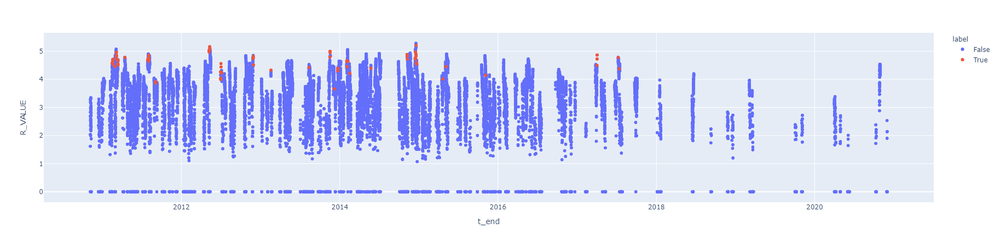

In [11]:
px.scatter(df.sharp.test, x='t_end', y='R_VALUE', color='label', hover_data=['prefix', 'arpnum'])

In [13]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

PREFIX = 'HARP'
keywords = ['USFLUX', 'MEANGBZ', 'R_VALUE', 'AREA', 'FLARE_INDEX']

fig = make_subplots(rows=len(keywords), cols=2,
                    shared_xaxes='all',
                    shared_yaxes='rows',
                    column_titles=['Training set', 'Testing set'],
                    row_titles=keywords,
                    vertical_spacing=0.02)
colors = lambda labels: [px.colors.qualitative.Plotly[i] for i in labels.astype(int)]

def add_keyword(fig, keyword, row):
    fig.add_trace(go.Scattergl(x=df.sharp.train.t_end, y=df.sharp.train[keyword],
                               customdata=df.sharp.train['arpnum'].to_numpy(),
                               hovertemplate=("<b>%{y} </b><br><br>" +
                                              "time: %{x}<br>" +
                                              f"{PREFIX} " + "%{customdata}<br>"),
                               mode='markers',
                               marker=dict(color=colors(df.sharp.train.label),
                                           opacity=0.5)),
                  row=row, col=1)

    fig.add_trace(go.Scattergl(x=df.sharp.test.t_end, y=df.sharp.test[keyword],
                               customdata=df.sharp.test['arpnum'].to_numpy(),
                               hovertemplate=("<b>%{y} </b><br><br>" +
                                              "time: %{x}<br>" +
                                              f"{PREFIX} " + "%{customdata}<br>"),
                               mode='markers',
                               marker=dict(color=colors(df.sharp.test.label),
                                           opacity=0.5)),
                  row=row, col=2)
    return fig

for i, keyword in enumerate(keywords):
    fig = add_keyword(fig, keyword, i+1)

fig.update_layout(#height=1000,# width=600, # extend to the entire webpage
                  title_text=f"{PREFIX} Keywords")
fig.write_html('eda_sharp_time_series.html')
#fig.show()

In [14]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

PREFIX = 'TARP'
keywords = ['USFLUX', 'MEANGBZ', 'R_VALUE', 'AREA', 'FLARE_INDEX']

fig = make_subplots(rows=len(keywords), cols=2,
                    shared_xaxes='all',
                    shared_yaxes='rows',
                    column_titles=['Training set', 'Testing set'],
                    row_titles=keywords,
                    vertical_spacing=0.02)
colors = lambda labels: [px.colors.qualitative.Plotly[i] for i in labels.astype(int)]

def add_keyword(fig, keyword, row):
    fig.add_trace(go.Scattergl(x=df.smarp.train.t_end, y=df.smarp.train[keyword],
                               customdata=df.smarp.train['arpnum'].to_numpy(),
                               hovertemplate=("<b>%{y} </b><br><br>" +
                                              "time: %{x}<br>" +
                                              f"{PREFIX} " + "%{customdata}<br>"),
                               mode='markers',
                               marker=dict(color=colors(df.smarp.train.label),
                                           opacity=0.5)),
                  row=row, col=1)

    fig.add_trace(go.Scattergl(x=df.smarp.test.t_end, y=df.smarp.test[keyword],
                               customdata=df.smarp.test['arpnum'].to_numpy(),
                               hovertemplate=("<b>%{y} </b><br><br>" +
                                              "time: %{x}<br>" +
                                              f"{PREFIX} " + "%{customdata}<br>"),
                               mode='markers',
                               marker=dict(color=colors(df.smarp.test.label),
                                           opacity=0.5)),
                  row=row, col=2)
    return fig

for i, keyword in enumerate(keywords):
    fig = add_keyword(fig, keyword, i+1)

fig.update_layout(#height=1000,# width=600,
                  title_text=f"{PREFIX} Keywords")
fig.write_html('eda_smarp_time_series.html')
#fig.show()

In [15]:
def analyze_data_df(df):
    fig = px.scatter_matrix(df,
                            height=800,
                            dimensions=FEATURES,
                            color='label')
    fig.show()

    df.hist(bins=20)
    plt.tight_layout()
    plt.show()

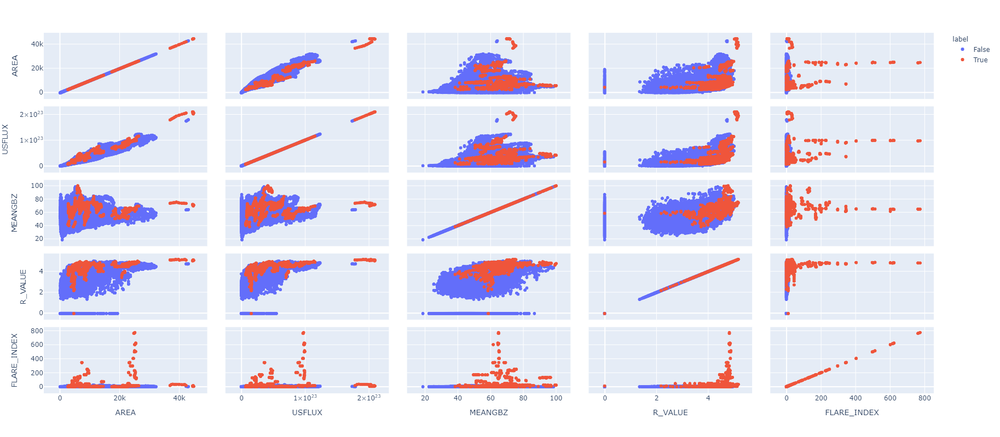

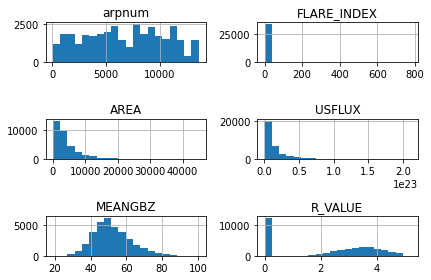

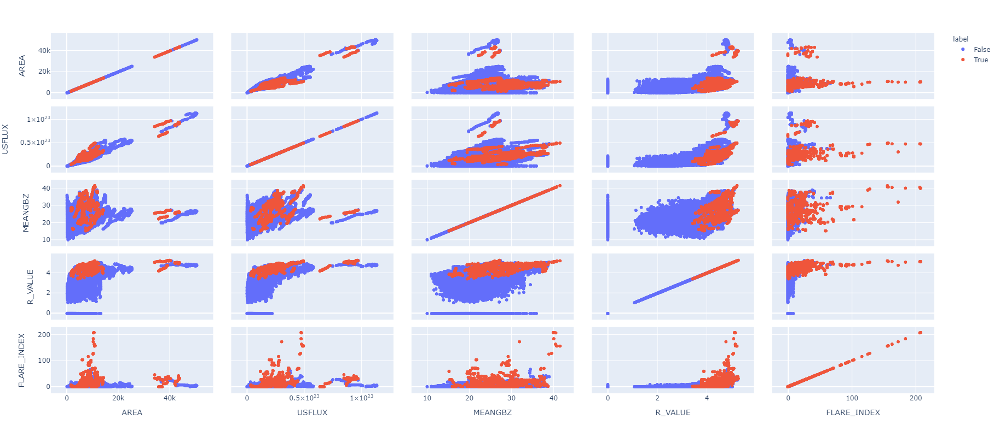

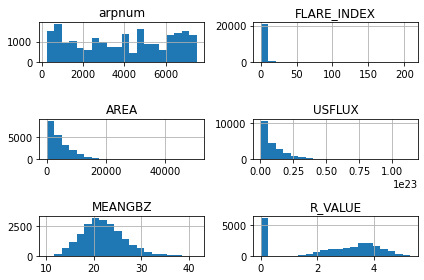

In [16]:
df_smarp_test = pd.read_csv('datasets/smarp/test.csv')
df_sharp_test = pd.read_csv('datasets/sharp/test.csv')
analyze_data_df(df_smarp_test)
analyze_data_df(df_sharp_test)